Ejercicio 5

In [ ]:
!pip install -q mediapy

In [ ]:
import mediapy as media
url = '/content/WhatsApp Video 2024-04-06 at 15.26.02 (1).mp4'
video = media.read_video(url)
media.show_video(video)

In [ ]:
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np


# Función para oscurecer una imagen:
def process_image(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    new_image_float = new_image.astype(np.float32)

    # Reducir el brillo de la imagen a la mitad
    new_image_float *= 0.5

    # Convertir la imagen de vuelta a uint8
    new_image_uint8 = np.clip(new_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobar si la imagen es en escala de grises (1 canal)
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        # Convertir la imagen de escala de grises a color (3 canales)
        result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    else:
        # Si ya es una imagen de color, simplemente hacer una copia
        result_image = frame.copy()

    # Dibujar cada contorno en la imagen
    for contour in contours:
        # Obtener el rectángulo delimitador para cada contorno
        x, y, w, h = cv2.boundingRect(contour)
        # Dibujar el rectángulo
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness)

    return result_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-06 at 15.26.02 (1).mp4'
filename_out = 'video_dark.mp4'

# Llama a la función para procesar el video
video_processor(filename_in, filename_out, process_image, 10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

In [ ]:
import cv2
import numpy as np

def process_frame_difference(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 30, 255, cv2.THRESH_BINARY)

    # Eliminar pequeños contornos de la imagen umbralizada
    cleaned_thresh = remove_small_contours(thresh)

    # Convierte la imagen umbralizada a color para mantener la consistencia con el video original
    thresh_color = cv2.cvtColor(cleaned_thresh, cv2.COLOR_GRAY2RGB)

    return thresh_color

def remove_small_contours(thresh):
    # Encuentra contornos en la imagen umbralizada
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Crea una máscara para eliminar contornos pequeños
    cleaned_thresh = np.zeros_like(thresh)

    # Define umbral de área mínima para eliminar contornos pequeños
    min_area_threshold = 1000

    for contour in contours:
        area = cv2.contourArea(contour)
        if area >= min_area_threshold:
            cv2.drawContours(cleaned_thresh, [contour], 0, 255, -1)

    return cleaned_thresh

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-06 at 15.26.02 (1).mp4'
filename_out = 'videopost.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_frame_difference, 10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)


In [ ]:
import cv2
import numpy as np

def remove_small_contours(thresh):
    # Encontrar contornos en la imagen umbralizada
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Crear una máscara para eliminar contornos pequeños
    cleaned_thresh = np.zeros_like(thresh)

    # Definir umbral de área mínima para eliminar contornos pequeños
    min_area_threshold = 1000

    for contour in contours:
        area = cv2.contourArea(contour)
        if area >= min_area_threshold:
            cv2.drawContours(cleaned_thresh, [contour], 0, 255, -1)

    return cleaned_thresh

def process_frame_difference_full(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 30, 255, cv2.THRESH_BINARY)

    # Dilatar la imagen umbralizada para mejorar la detección de contornos
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(thresh, kernel, iterations=1)

    # Encontrar contornos en la imagen dilatada
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Filtrar contornos por área mínima
    filtered_contours = []
    min_area_threshold = 4000 # Umbral de área mínima deseada



    for contour in contours:
        area = cv2.contourArea(contour)
        if area >= min_area_threshold:
            filtered_contours.append(contour)

    # Dibujar cuadros delimitadores alrededor de los contornos filtrados
    if kwargs.get('draw_mode', 0) == 0:
        result_image = draw_contours(new_image, filtered_contours)
    elif kwargs.get('draw_mode', 0) == 1:
        result_image = draw_contours(thresh, filtered_contours)

    return result_image

# Nombres de los archivos de video de entrada y salida
filename_in = '/content/WhatsApp Video 2024-04-06 at 15.26.02 (1).mp4'
filename_out = 'videopost_full.mp4'

# Llama a la función para procesar el video
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=1)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

# Llama a la función para procesar el video
filename_out = 'videopost_full_2.mp4'
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=0)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

 ## Flujo óptico disperso.

In [ ]:
!pip install opencv-python
!pip install numpy


In [ ]:
import cv2
import numpy as np

def process_sparse_optical_flow(new_image, prev_image):
    # Prepara las imágenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)


    # Verificar si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, "prev_points"):
        # Definir parámetros para la detección de esquinas de Shi-Tomasi
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        # Detectar puntos característicos en la imagen anterior
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)
        # Crear una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.mask = np.zeros_like(new_image)

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Calcula el flujo óptico de Lucas-Kanade
    new_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_gray, new_gray, process_sparse_optical_flow.prev_points, None, **lk_params)

    # Filtra puntos buenos
    good_new = new_points[status == 1]
    good_old = process_sparse_optical_flow.prev_points[status == 1]


    # Dibuja líneas y puntos sobre la nueva imagen
    for new, old in zip(good_new, good_old):
        a, b = new.ravel().astype(int)
        c, d = old.ravel().astype(int)
        cv2.line(process_sparse_optical_flow.mask, (a, b), (c, d), (0, 255, 0), 2)
        cv2.circle(new_image, (a, b), 3, (0, 255, 0), -1)

    # Combina la imagen original con las líneas de flujo óptico dibujadas
    output = cv2.add(new_image, process_sparse_optical_flow.mask)

    # Actualiza puntos para el siguiente cuadro
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)

    return output

def process_video_with_optical_flow(input_video_path, output_video_path):
    cap = cv2.VideoCapture(input_video_path)

    # Lee el primer frame
    ret, prev_frame = cap.read()

    # Configura el escritor de video
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Procesa el frame actual con el flujo óptico disperso
        output_frame = process_sparse_optical_flow(frame, prev_frame)

        # Guarda el frame procesado en el video de salida
        out.write(output_frame)

        # Actualizar el frame previo
        prev_frame = frame

    # Liberar recursos
    cap.release()
    out.release()
    cv2.destroyAllWindows()

# Ruta de tu video de entrada
input_video_path = 'videopost_full_2.mp4'
# Ruta donde se guardará el video procesado con el flujo óptico visualizado
output_video_path = 'output_video_with_optical_flow.mp4'

# Llama a la función para procesar el video con el flujo óptico disperso
process_video_with_optical_flow(input_video_path, output_video_path)

In [ ]:
import mediapy as media
url = '/content/output_video_with_optical_flow.mp4'
video = media.read_video(url)
media.show_video(video)

 ## Flujo óptico denso

In [ ]:
import cv2
import numpy as np

def process_dense_optical_flow(video_path, output_video_path):
    cap = cv2.VideoCapture(video_path)

    # Verificar si el video se abrió correctamente
    if not cap.isOpened():
        print(f"No se pudo abrir el video {video_path}")
        return

    # Obtener propiedades del video
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    # Crea el objeto VideoWriter para guardar el video de salida
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    # Inicializa variables para el primer frame
    ret, frame = cap.read()
    if not ret:
        print("No se pudo leer el primer frame")
        return
    prev_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Convierte el frame actual a escala de grises
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calcula el flujo óptico
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Computa magnitud y ángulo de los vectores 2D
        magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

        # Crea una máscara HSV para visualizar el flujo óptico
        mask = np.zeros_like(frame)
        mask[..., 0] = angle * 180 / np.pi / 2
        mask[..., 1] = 255
        mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

        # Convierte de HSV a RGB
        rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)




        out.write(rgb)

        # Actualiza el frame anterior
        prev_gray = gray

    # Libera los recursos
    cap.release()
    out.release()
    print(f"Video de salida guardado en: {output_video_path}")

# Ruta del video de entrada
input_video_path = 'videopost.mp4'

# Ruta del video de salida
output_video_path = 'output_video.mp4'

# Llama a la función para procesar el flujo óptico del video y guardar el video de salida
process_dense_optical_flow(input_video_path, output_video_path)

Video de salida guardado en: output_video.mp4


In [ ]:
import mediapy as media
url = '/content/output_video.mp4'
video = media.read_video(url)
media.show_video(video)

#Reflexión sobre los resultados:

#Flujo óptico disperso:
Los resultados obtenidos compañan al movimiento del objeto. Si bien, al principio  del video se detectan diversos objetos más pequeños, como los cuadros, a los cuales se le añaden los puntos respecto de algunos vértices en la imagen, resalta y podemos ver con claridad  lo que queremos destacar a travéz de las lineas, que es el movimiento de la persona de un lado hacia otro.


#Flujo óptico denso:
En este flujo se notan varios comportamientos extraños  de detección de movimiento al finalizar el video, los cuales no pertenecen al movimiento de la persona, pero aún así se puede ver que se ha logrando un fondo negro y el movimiento de la persona en diferentes gamas de  colores como lo deseeabamos.



#Ejercicio 6

#Clasificación de imágenes:
Los modelos de clasificación de imágenes son algoritmos de aprendizaje automático o inteligencia artificial diseñados para identificar y clasificar objetos o características dentro de imágenes digitales. Estos modelos son una parte fundamental de la visión por computadora, una rama de la inteligencia artificial que se ocupa de cómo las computadoras pueden ganar un alto nivel de comprensión a partir de contenido visual digital.

Ejemplo: el objetivo es determinar la categoría general de la imagen completa. En este caso, la imagen se clasifica como "playa", indicando que representa una escena de playa.

En términos simples, un modelo de clasificación de imágenes toma una imagen como entrada y predice la clase o categoría a la que pertenece esa imagen.
La evolución de las redes de clasificación de imágenes ha sido un viaje notable marcado por avances significativos en el campo de la inteligencia artificial y la visión por computadora.

#Detección de objetos:
La detección de objetos es una de las técnicas más importantes en el campo de la visión por computadora, que se enfoca en la identificación y localización de entidades dentro de imágenes digitales. Esta disciplina combina aspectos de la clasificación de imágenes y la localización para identificar múltiples objetos en imágenes y determinar su posición exacta a través de un "cuadro delimitador" o bounding box. La detección de objetos tiene aplicaciones amplias y significativas, incluyendo, pero no limitado a, sistemas de vigilancia, navegación de vehículos autónomos, y análisis de imágenes médicas.


La Detección de Objetos es una tarea crucial en la visión por computadora, donde el objetivo es identificar y localizar varios objetos, como automóviles, ciclistas y semáforos, dentro de una imagen. Esto se logra definiendo regiones rectangulares usando coordenadas  y asociándolas con un vector de clasificación y probabilidad.
La Detección de Objetos supera la clasificación de imágenes en importancia práctica, ya que permite la detección de objetos para su posterior análisis, modificación o clasificación. Técnicas como la Difusión Estable y el Intercambio de Caras aprovechan la detección de objetos para manipular y reemplazar objetos o rostros en imágenes. Los desafíos surgen cuando múltiples objetos de la misma clase, como peatones, se superponen, lo que lleva al uso de NMS (Supresión de No Máximos) como una solución común, aunque están surgiendo métodos alternativos.

Ejemplo: el objetivo es detectar y delimitar la ubicación de un automóvil en una imagen de una calle. El resultado incluye las coordenadas de un cuadro delimitador que rodea el automóvil detectado.


Ambas tareas son esenciales en el campo de la visión por computadora y se utilizan en una amplia gama de aplicaciones, como reconocimiento facial, vehículos autónomos, sistemas de vigilancia, entre otros. A menudo, las aplicaciones prácticas requieren el uso combinado de la localización de objetos y la clasificación de imágenes para lograr tareas más complejas, como la detección y reconocimiento de múltiples objetos en una escena.


Ejemplo de Clasificación de imágenes:

In [2]:
!pip install tensorflow pillow

In [3]:


import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from PIL import Image
import numpy as np

# Cargar el modelo preentrenado EfficientNetB0
model = EfficientNetB0(weights='imagenet')

def classify_image(img_path):
    # Cargar y preparar la imagen
    img = Image.open(img_path)
    img = img.resize((224, 224))  # Tamaño de entrada para EfficientNetB0

    # Convertir la imagen a un array y procesarla
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Realizar la predicción con el modelo
    predictions = model.predict(img_array)

    # Decodificar y retornar las predicciones
    return decode_predictions(predictions, top=3)[0]

# Prueba con una imagen local
img_path = '/content/Golden-Retriever.webp'  # Reemplaza con la ruta de tu imagen
predictions = classify_image(img_path)

print('\n')

# Mostrar las predicciones
for i, (imagenet_id, label, score) in enumerate(predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

35363/35363 [==============================] - 0s 0us/step


1: golden_retriever (0.98)
2: Labrador_retriever (0.00)
3: Afghan_hound (0.00)


En este script, se carga un modelo EfficientNetB0 pre-entrenado con pesos de un modelo entrenado con el dataset ImageNet. Luego, el modelo se usa para clasificar una imagen, que se carga, se procesa y se pasa al modelo para  obtener predicciones. Las predicciones se decodifican en etiquetas humanamente legibles y se imprimen con sus respectivas probabilidades: \


1: golden_retriever (0.98) \
2: Labrador_retriever (0.00) \
3: Afghan_hound (0.00)


En este caso, detectó que el de la imagen es un golden.


Ejemplo de detección de objetos:

In [5]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.6/749.6 kB 7.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

100%|██████████| 6.23M/6.23M [00:00<00:00, 48.3MB/s]



0: 448x640 1 person, 2 cars, 1 bus, 1 truck, 334.9ms
Speed: 32.2ms preprocess, 334.9ms inference, 2519.7ms postprocess per image at shape (1, 3, 448, 640)


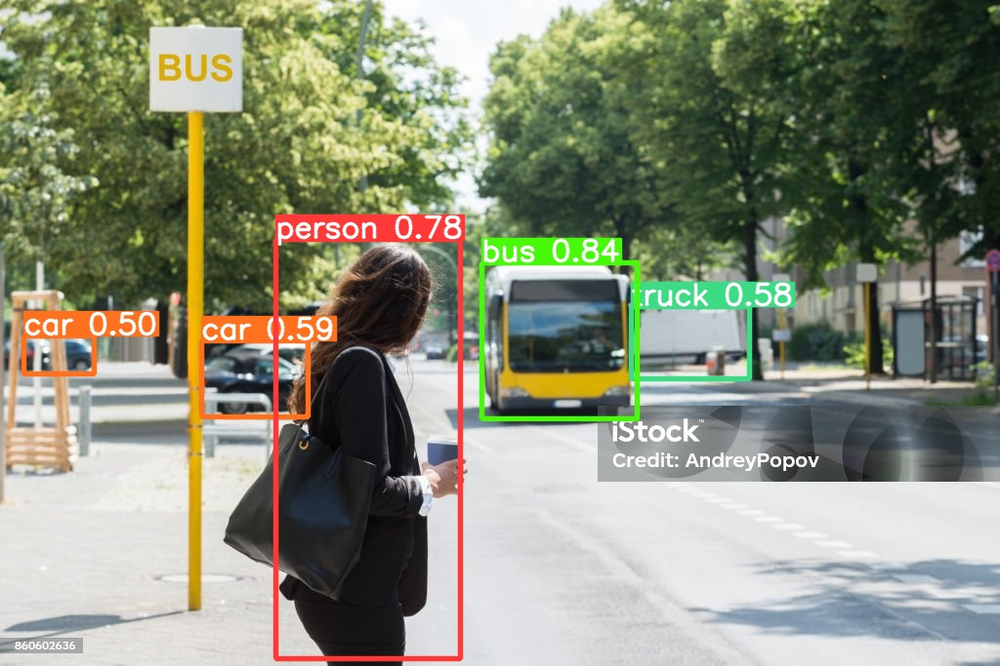

In [6]:
# Importamos las librerías a utilizar
import cv2
from ultralytics import YOLO
from IPython.display import Image

# Load the pre-trained YOLOv8 model
model = YOLO('yolov8n')  # This will automatically download the model weights

# Perform inference
source_img = cv2.imread('/content/istockphoto-860602636-1024x1024.jpg')
results = model(source_img)

# Visualize the results on the frame
annotated_frame = results[0].plot()

# Guardamos el resultado en JPG
cv2.imwrite('bus_results.jpg', annotated_frame)

# Mostramos el resultado en Colab
Image('bus_results.jpg')

Detección de objetos utilizando YOLOv8, una de las versiones más recientes y avanzadas del algoritmo "You Only Look Once" (YOLO), conocido por su rapidez y precisión.
En este ejemplo, se pudo detectar la persona, el colectivo y los autos.